# CF Project 6.2: Exploring relationships

## This script contains the following:

### 01. Import libraries and file
### 02. Exploring Relationships
     Correlations
     Scatterplots
     Pair Plots
     Categorical Plots
### 03. Exporting Dataframe

# 01. Import libraries and file

In [1]:
# Import libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib
import os

In [2]:
# This option ensures the charts you create are displayed in the notebook without the need to "call" them specifically.

%matplotlib inline

In [3]:
# Define path
path = r'C:\Users\olufunsoo\Documents\CFProject'

In [4]:
# Import file 'Project_Data_Checked.csv' as df
df = pd.read_csv(os.path.join(path, '02 Data', 'Prepared Data', 'Project_Data_Checked1.csv'))

In [5]:
df.columns

Index(['Unnamed: 0', 'Federal Provider Number', 'Provider Name',
       'Provider State', 'Ownership Type', 'Number of Certified Beds',
       'Number of Residents in Certified Beds', 'Provider Type',
       'Provider Resides in Hospital',
       'Date First Approved to Provide Medicare and Medicaid services',
       'Continuing Care Retirement Community', 'Special Focus Facility',
       'Provider Changed Ownership in Last 12 Months',
       'With a Resident and Family Council',
       'Automatic Sprinkler Systems in All Required Areas', 'Overall Rating',
       'Health Inspection Rating', 'QM Rating', 'Staffing Rating',
       'RN Staffing Rating',
       'Reported Licensed Staffing Hours per Resident per Day',
       'Reported Physical Therapist Staffing Hours per Resident Per Day',
       'Adjusted CNA Staffing Hours per Resident per Day',
       'Adjusted LPN Staffing Hours per Resident per Day',
       'Adjusted RN Staffing Hours per Resident per Day',
       'Adjusted Total Nurs

# 02. Exploring Relationships

In [6]:
df['Date First Approved to Provide Medicare and Medicaid services'].head(5)

0      1/1/1974
1     10/8/1969
2      9/1/1975
3    12/29/1970
4      1/1/1975
Name: Date First Approved to Provide Medicare and Medicaid services, dtype: object

#### Derive new column 'Nursing Home Age' from column 'Date First Approved to Provide Medicare and Medicaid services'

In [7]:
# Convert 'Date First Approved to Provide Medicare and Medicaid services' to timestamp
df['Date First Approved to Provide Medicare and Medicaid services'] = pd.to_datetime(df['Date First Approved to Provide Medicare and Medicaid services'], format='mixed')

In [8]:
# Convert 'Processing Date' to timestamp
df['Processing Date'] = pd.to_datetime(df['Processing Date'], format='mixed')

In [9]:
# Derive column 'Nursing Home Age'
df['Nursing Home Age'] = (df['Processing Date'] - df['Date First Approved to Provide Medicare and Medicaid services'])

In [10]:
df['Nursing Home Age'].head()

0   15584 days
1   17130 days
2   14976 days
3   16683 days
4   15219 days
Name: Nursing Home Age, dtype: timedelta64[ns]

#### Creating a subset of necessary columns for the correlation check

In [11]:
# Creating subset
df_first = df[['Nursing Home Age', 'Adjusted Total Nurse Staffing Hours per Resident per Day', 'Total Number of Penalties', 'Number of Certified Beds', 'Number of Residents in Certified Beds', 'Overall Rating', 'Total Weighted Health Survey Score']]

In [12]:
df_first

,Nursing Home Age,Adjusted Total Nurse Staffing Hours per Resident per Day,Total Number of Penalties,Number of Certified Beds,Number of Residents in Certified Beds,Overall Rating,Total Weighted Health Survey Score
0,15584 days,3.81554,1,124,102,4.0,22.667
1,17130 days,3.28225,1,183,168,1.0,48.667
2,14976 days,3.72376,0,77,77,5.0,15.333
3,16683 days,5.53756,1,107,96,4.0,25.333
4,15219 days,5.14766,0,88,81,4.0,13.333
...,...,...,...,...,...,...,...
15045,1458 days,3.54062,1,120,110,1.0,395.333
15046,1049 days,3.29893,4,90,37,1.0,148.000
15047,854 days,3.50189,2,80,64,1.0,84.000
15048,877 days,3.46744,2,103,103,2.0,82.667


### Correlation

In [13]:
# Checking the correlation of the variables in the subset
df_first.corr()

,Nursing Home Age,Adjusted Total Nurse Staffing Hours per Resident per Day,Total Number of Penalties,Number of Certified Beds,Number of Residents in Certified Beds,Overall Rating,Total Weighted Health Survey Score
Nursing Home Age,1.000000,-0.069185,-0.020654,0.236833,0.251805,-0.029115,-0.005173
Adjusted Total Nurse Staffing Hours per Resident per Day,-0.069185,1.000000,-0.047221,-0.197949,-0.206001,0.321535,-0.075602
Total Number of Penalties,-0.020654,-0.047221,1.000000,0.061989,0.016266,-0.377941,0.506589
Number of Certified Beds,0.236833,-0.197949,0.061989,1.000000,0.930740,-0.165930,0.066892
Number of Residents in Certified Beds,0.251805,-0.206001,0.016266,0.930740,1.000000,-0.123506,0.015521
Overall Rating,-0.029115,0.321535,-0.377941,-0.165930,-0.123506,1.000000,-0.550656
Total Weighted Health Survey Score,-0.005173,-0.075602,0.506589,0.066892,0.015521,-0.550656,1.000000


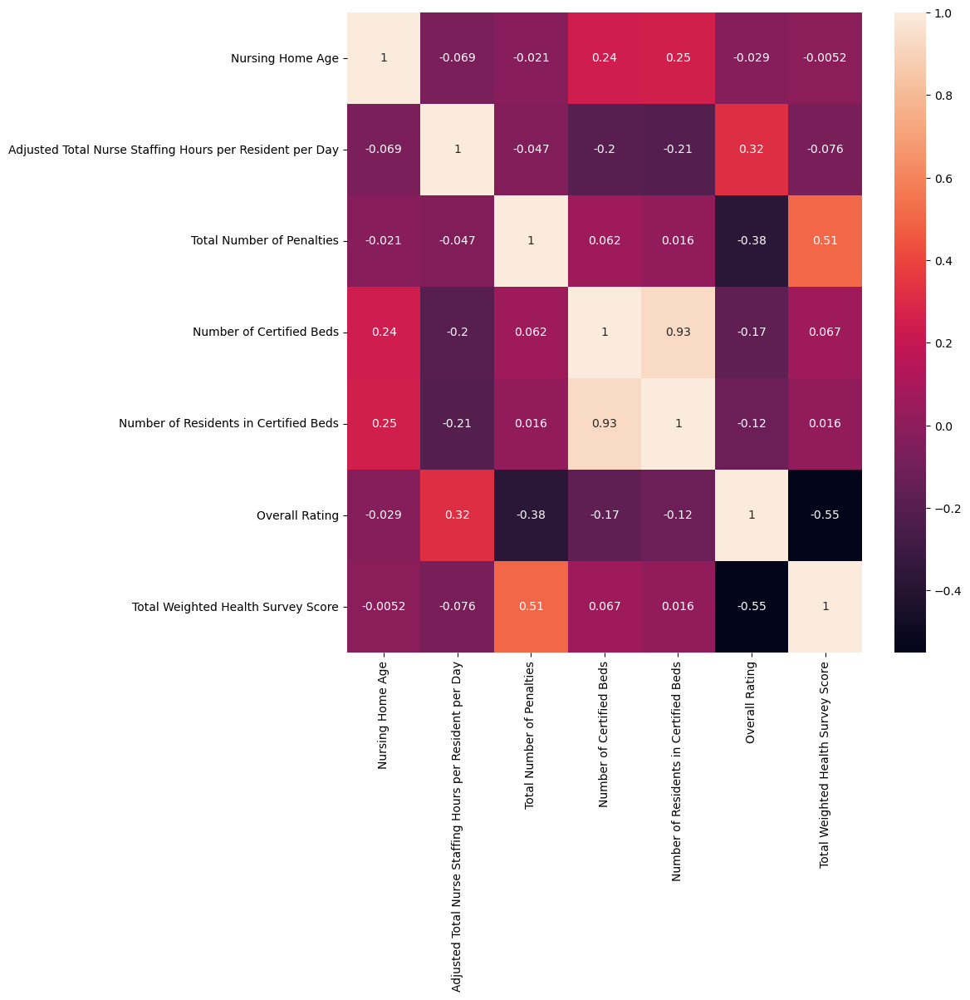

In [14]:
# Create a subplot with matplotlib
f,ax = plt.subplots(figsize=(10,10))

# Create the correlation heatmap in seaborn by applying a heatmap onto the correlation matrix and the subplots defined above.
corr = sns.heatmap(df_first.corr(), annot = True, ax = ax) # The `annot` argument allows the plot to 
#place the correlation coefficients onto the heatmap.

#### The correlation heatmap shows majorly weak relationships between the variables - some positive, some negative. The variables with the strongest correlation are 'Number of Certified Beds' and 'Number of Residents in Certified Beds'.
#### Taking the 'Overall rating' as the dependent variable, the heatmap shows a weak negative relationship with all variables, except 'Adjusted Total Nurse Staffing Hours per Resident per Day' where a moderate relationship can be seen. So, for example, as the age of the nursing home or Number of Residents or Number of certified beds increases, the overall rating decreases (and vice versa). However, the overall rating increases with the increase of adjusted total nurse staffing hours.

In [15]:
# Export visual
corr.figure.savefig(os.path.join(path,'04 Analysis', 'Visualizations', 'corrheatmap1.png'))

### Scatterplots

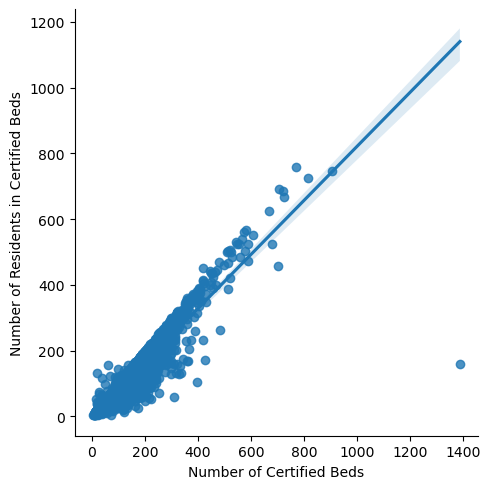

In [16]:
# Create a scatterplot for the 'Number of Certified Beds' and 'Number of Residents in Certified Beds' columns in seaborn

sp1 = sns.lmplot(x = 'Number of Certified Beds', y = 'Number of Residents in Certified Beds', data = df)

#### The scatter plot shows a linear relationship between the 'Number of Certified Bed' and the 'Number of Residents in the certified beds', and the data points are close to the line, showing a strong relationship. However, there is a outlier of 159 residents on 1389 certified beds. This would be further investigated.

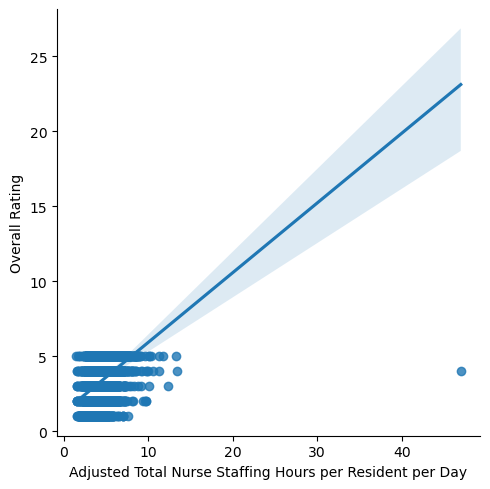

In [17]:
# Create a scatterplot for the 'Adjusted Total Nurse Staffing Hours per Resident per Day' and 'Overall Rating' columns in seaborn

sp2 = sns.lmplot(x = 'Adjusted Total Nurse Staffing Hours per Resident per Day', y = 'Overall Rating', data = df)

#### The scatter plot does not show a linear relationship between 'Overall Rating' and 'Adjusted Total Nurse Staffing Hours'. This means an increase or decrease in the staffing hours only do not have an impact on the overall rating.

In [18]:
# Exporting scatterplots visuals
sp1.figure.savefig(os.path.join(path,'04 Analysis', 'Visualizations', 'scatterplot1.png'))

In [19]:
sp2.figure.savefig(os.path.join(path,'04 Analysis', 'Visualizations', 'scatterplot2.png'))

### Pair Plots

In [20]:
# Create a pair plot 

g = sns.pairplot(df)

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


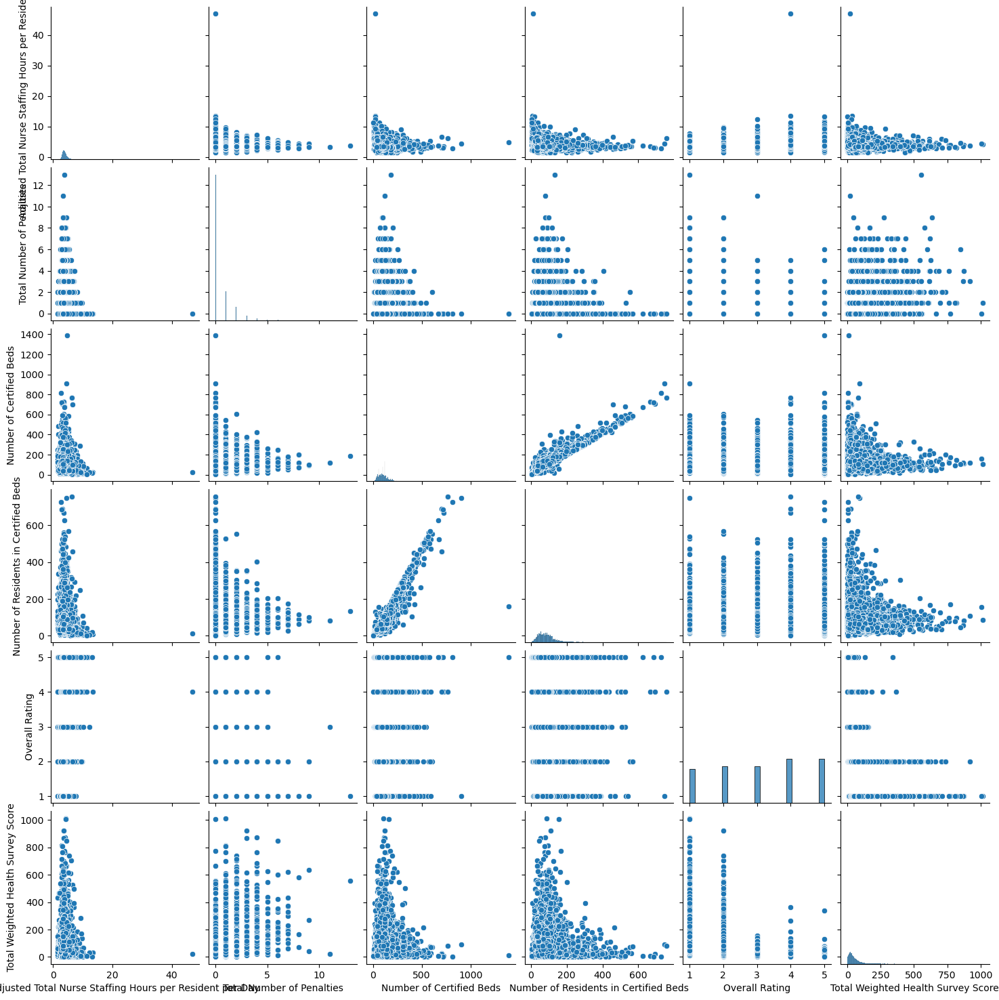

In [21]:
# Create a pair plot for subset
g = sns.pairplot(df_first)

#### The scatterplots in the pair plot confirms the information given in the correlation heat map, as they show no linear relationship between the variables, except for the number of certified beds and the number of residents in certified beds. The variables I will like to explore further include:
#### Overall Rating - this is a categorical variable. I would really want to understand how this is impacted by the other variables
#### Number of certified beds,  Number of residents in certified beds, Adjusted Total Nurse Staffing Hours per Resident per Day and Total Weighted Health Survey Score - these variables appear to show relationship with other variables

In [22]:
# Export pair plot
g.figure.savefig(os.path.join(path,'04 Analysis', 'Visualizations', 'pairplot.png'))

### Categorical plots

#### Creating a categorical variable that splits the 'Total Weighted Health Survey Score' column into categories

<Axes: xlabel='Total Weighted Health Survey Score', ylabel='Count'>

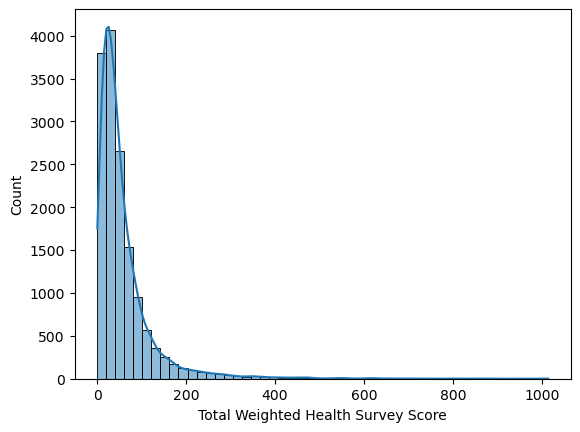

In [23]:
sns.histplot(df['Total Weighted Health Survey Score'], bins =50, kde = True)

In [24]:
df.loc[df['Total Weighted Health Survey Score'] < 100, 'Health Survey Score category'] = 'Good Score'

In [25]:
df.loc[(df['Total Weighted Health Survey Score'] >= 100) & (df['Total Weighted Health Survey Score'] < 200), 'Health Survey Score category'] = 'Middle Score'

In [26]:
df.loc[df['Total Weighted Health Survey Score'] > 200, 'Health Survey Score category'] = 'Bad Score'

In [27]:
df['Health Survey Score category'].value_counts(dropna = False)

Health Survey Score category
Good Score      12932
Middle Score     1528
Bad Score         587
NaN                 3
Name: count, dtype: int64

In [28]:
df.columns

Index(['Unnamed: 0', 'Federal Provider Number', 'Provider Name',
       'Provider State', 'Ownership Type', 'Number of Certified Beds',
       'Number of Residents in Certified Beds', 'Provider Type',
       'Provider Resides in Hospital',
       'Date First Approved to Provide Medicare and Medicaid services',
       'Continuing Care Retirement Community', 'Special Focus Facility',
       'Provider Changed Ownership in Last 12 Months',
       'With a Resident and Family Council',
       'Automatic Sprinkler Systems in All Required Areas', 'Overall Rating',
       'Health Inspection Rating', 'QM Rating', 'Staffing Rating',
       'RN Staffing Rating',
       'Reported Licensed Staffing Hours per Resident per Day',
       'Reported Physical Therapist Staffing Hours per Resident Per Day',
       'Adjusted CNA Staffing Hours per Resident per Day',
       'Adjusted LPN Staffing Hours per Resident per Day',
       'Adjusted RN Staffing Hours per Resident per Day',
       'Adjusted Total Nurs

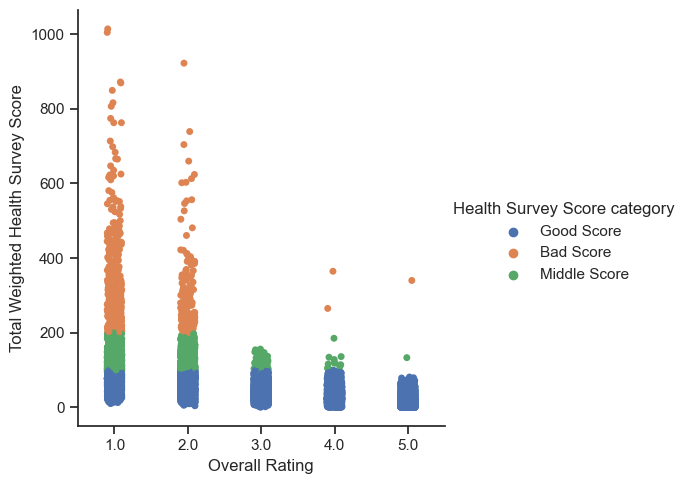

In [29]:
# Create a categorical plot in seaborn using the price categories created above

sns.set(style="ticks")
g1 = sns.catplot(x='Overall Rating', y='Total Weighted Health Survey Score', hue= 'Health Survey Score category', data = df)

#### The categorical plot above shows that the total weighted health score is not the only variable that determines the overall rating, although it plays a significant role, as a larger number of nursing homes with bad health survey scores and middle health survey scores can be found in the rating of 1 and 2. However, 3 nursing homes with bad scores can be found in the rating of 4 (2 nursing homes) and 5 (1 nursing home). 

In [30]:
# Export Visual
g1.figure.savefig(os.path.join(path,'04 Analysis', 'Visualizations', 'categoricalplot.png'))

# 03. Export Dataframe

In [31]:
# Exporting df as Project_Data_Updated.csv
df.to_csv(os.path.join(path, '02 Data', 'Prepared Data', 'Project_Data_Updated1.csv'))

### Question(s) answered and further arising question
#### This exploratory analysis seem to have answered only one of the questions:
#### 1.	What is the impact of the different variables on the assessment and ratings of the nursing homes? The analysis has shown that the variables, on their own, has no significant impact on the overall impact. This means that there is a combiantion of factors or variables before the rating is made. How are the variables combined to give the rating? Then, it is important to explore the relationship between the ratings (this was not part of this analysis' consideration)

### Hypothesis
#### An hypothesis that could be made from this analysis is when the total weighted score of a nursing home is high, then it will only be given low ratings, regardless of other variables.